# **Group Assignment** - Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season (1:springer, 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pandas_profiling
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from collections import Counter
import xgboost as xgb
from sklearn.metrics import r2_score,mean_squared_error
from collections import Counter

## PART I: Exploratory Data Analysis

In [28]:
bike_df = pd.read_csv('bikes.csv', parse_dates=["dteday"])
bike=bike_df.copy()

In [29]:
bike.isnull().sum().sum()

0

In [50]:
bike.dtypes

instant                int64
dteday        datetime64[ns]
season                 int64
holiday                int64
weekday               object
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
cnt                    int64
year                   int64
month                 object
day                    int64
hour                   int64
minute                 int64
second                 int64
year_month            object
dtype: object

In [31]:
profile = pandas_profiling.ProfileReport(bike)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
bike["year"] = bike["dteday"].dt.year
bike["month"] = bike["dteday"].dt.month
bike["day"] = bike["dteday"].dt.day
bike["hour"] = bike["dteday"].dt.hour
bike["minute"] = bike["dteday"].dt.minute
bike["second"] = bike["dteday"].dt.second

In [36]:
bike

,instant,dteday,season,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,year,month,day,hour,minute,second
0,1,2011-01-01,1,0,June,0,1,0.24,0.2879,0.81,0.0000,3,13,16,2011,January,1,0,0,0
1,2,2011-01-01,1,0,June,0,1,0.22,0.2727,0.80,0.0000,8,32,40,2011,January,1,0,0,0
2,3,2011-01-01,1,0,June,0,1,0.22,0.2727,0.80,0.0000,5,27,32,2011,January,1,0,0,0
3,4,2011-01-01,1,0,June,0,1,0.24,0.2879,0.75,0.0000,3,10,13,2011,January,1,0,0,0
4,5,2011-01-01,1,0,June,0,1,0.24,0.2879,0.75,0.0000,0,1,1,2011,January,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,0,January,1,2,0.26,0.2576,0.60,0.1642,11,108,119,2012,December,31,0,0,0
17375,17376,2012-12-31,1,0,January,1,2,0.26,0.2576,0.60,0.1642,8,81,89,2012,December,31,0,0,0
17376,17377,2012-12-31,1,0,January,1,1,0.26,0.2576,0.60,0.1642,7,83,90,2012,December,31,0,0,0
17377,17378,2012-12-31,1,0,January,1,1,0.26,0.2727,0.56,0.1343,13,48,61,2012,December,31,0,0,0


[Text(0.5, 0, 'day'), Text(0.5, 1.0, 'day count')]

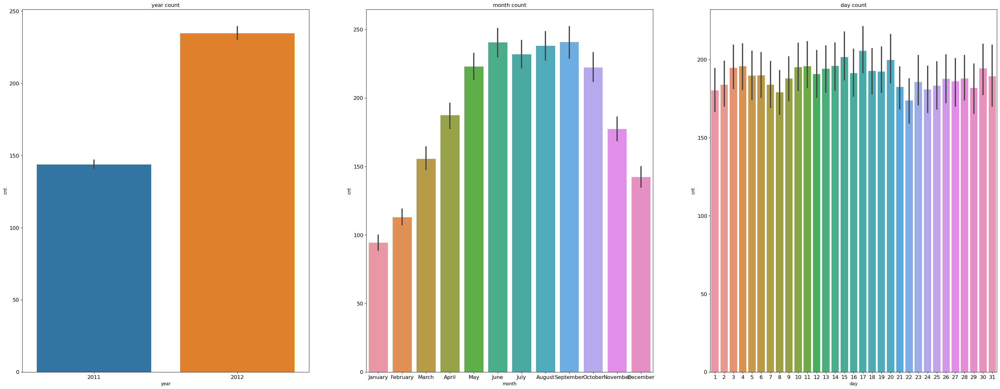

In [37]:
figure, ((ax1,ax2,ax3)) = plt.subplots(nrows=1, ncols=3)
figure.set_size_inches(40,15)

sns.barplot(data=bike, x="year", y="cnt", ax=ax1)
sns.barplot(data=bike, x="month", y="cnt", ax=ax2)
sns.barplot(data=bike, x="day", y="cnt", ax=ax3)

ax1.set(ylabel='cnt',title="year count")
ax2.set(xlabel='month',title="month count")
ax3.set(xlabel='day', title="day count")

[Text(0.5, 0, 'Working Day'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Rental counts by Working Day')]

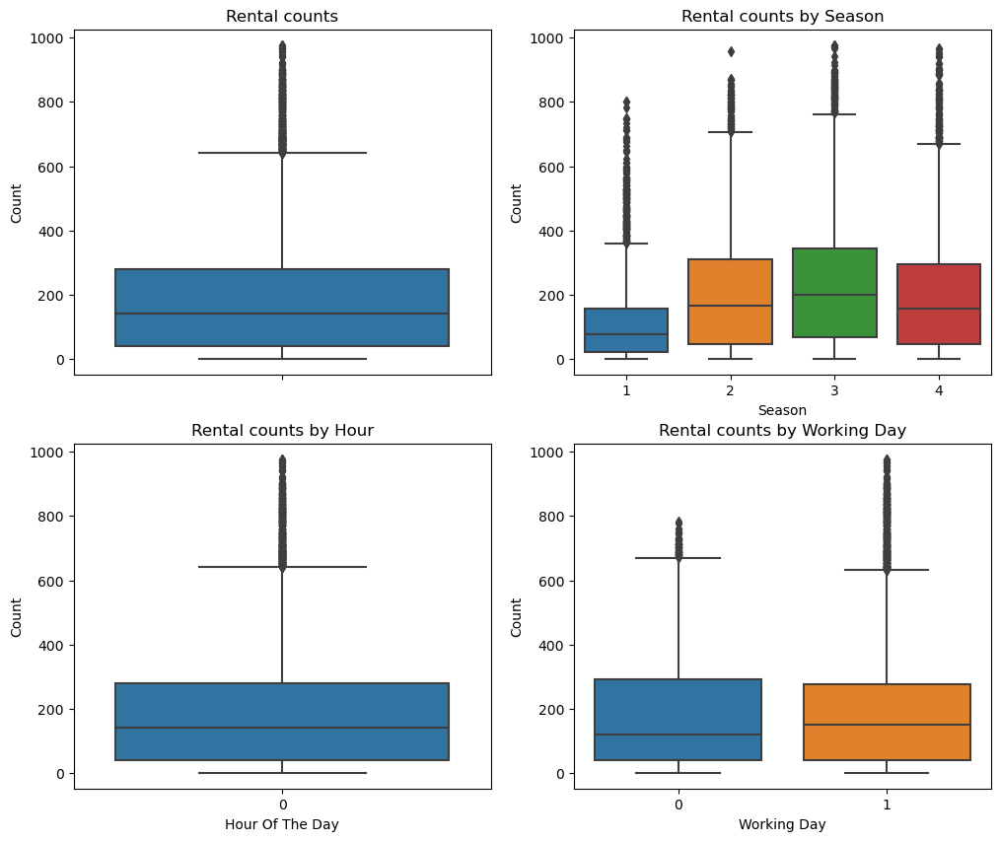

In [12]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(12, 10)
sns.boxplot(data=bike,y="cnt",orient="v",ax=axes[0][0])
sns.boxplot(data=bike,y="cnt",x="season",orient="v",ax=axes[0][1])
sns.boxplot(data=bike,y="cnt",x="hour",orient="v",ax=axes[1][0])
sns.boxplot(data=bike,y="cnt",x="workingday",orient="v",ax=axes[1][1])

axes[0][0].set(ylabel='Count',title="Rental counts")
axes[0][1].set(xlabel='Season', ylabel='Count',title="Rental counts by Season")
axes[1][0].set(xlabel='Hour Of The Day', ylabel='Count',title="Rental counts by Hour")
axes[1][1].set(xlabel='Working Day', ylabel='Count',title="Rental counts by Working Day")

In [38]:
bike["year_month"] = bike["dteday"].apply(lambda x: f"{x.year}-{x.month}")

<AxesSubplot: xlabel='year_month', ylabel='cnt'>

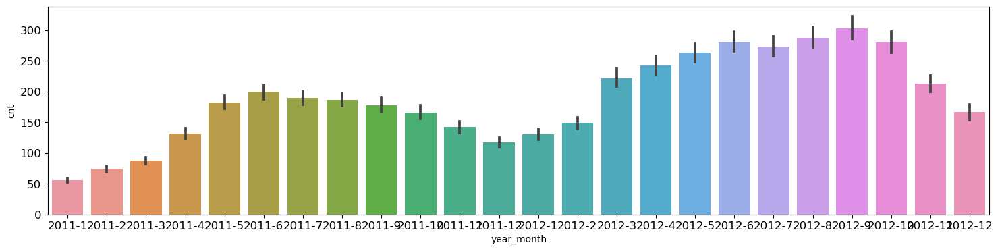

In [39]:
fig, ax1 = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(18, 4)

sns.barplot(data=bike, x="year_month", y="cnt", ax=ax1)

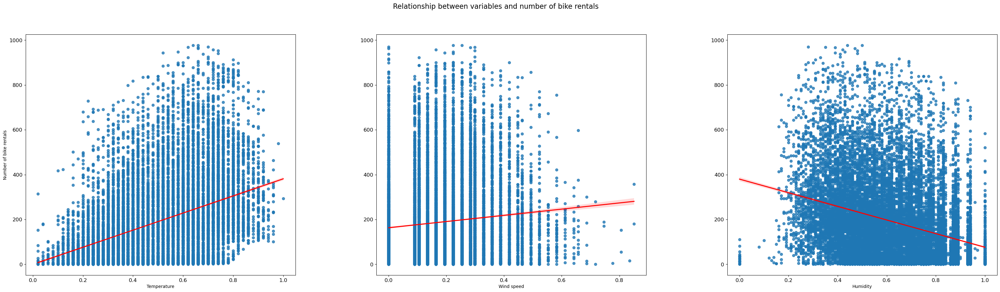

In [40]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3)
fig.set_size_inches(40, 10)

sns.regplot(x="temp", y="cnt", data=bike, ax=ax1, line_kws={"color":"red"})
sns.regplot(x="windspeed", y="cnt", data=bike, ax=ax2, line_kws={"color":"red"})
sns.regplot(x="hum", y="cnt", data=bike, ax=ax3, line_kws={"color":"red"})

ax1.set_xlabel("Temperature")
ax1.set_ylabel("Number of bike rentals")
ax2.set_xlabel("Wind speed")
ax2.set_ylabel("")
ax3.set_xlabel("Humidity")
ax3.set_ylabel("")

plt.suptitle("Relationship between variables and number of bike rentals", fontsize=16)
fig.subplots_adjust(wspace=0.3)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)

## PART II: Prediction Model

In [42]:
bike.drop(["casual","registered"],axis=1,inplace=True)

In [43]:
bike.dtypes

instant                int64
dteday        datetime64[ns]
season                 int64
holiday                int64
weekday               object
workingday             int64
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
cnt                    int64
year                   int64
month                 object
day                    int64
hour                   int64
minute                 int64
second                 int64
year_month            object
dtype: object

In [49]:
X= bike.drop(["cnt"],axis=1)
y = bike["cnt"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=99)

Sc = StandardScaler()
ohe = OneHotEncoder(handle_unknown='ignore')

numeric_features = ["temp","atemp","hum","windspeed"]
categorical_features = ["season","year","month","hour","holiday","weekday","workingday","weathersit"]

preprocess = ColumnTransformer(
    transformers=[
                ('num', 'passthrough', numeric_features),
                ('cat', ohe, categorical_features)
                ])

model = Pipeline(steps=[('preprocess', preprocess),
                                    ('model', xgb.XGBRegressor(
            random_state=99,
            learning_rate=0.1,
            n_estimators=400,
            max_depth=7,
            objective='reg:squarederror',
            tree_method='hist',
            eval_metric='rmse',
        ))])
            
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred = [round(p) for p in y_pred] 
r2 = r2_score(y_test, y_pred)

print("R2 score: ", r2)

R2 score:  0.43989354885866083


In [18]:
results=Counter(y_pred)
original=Counter(bike["cnt"])

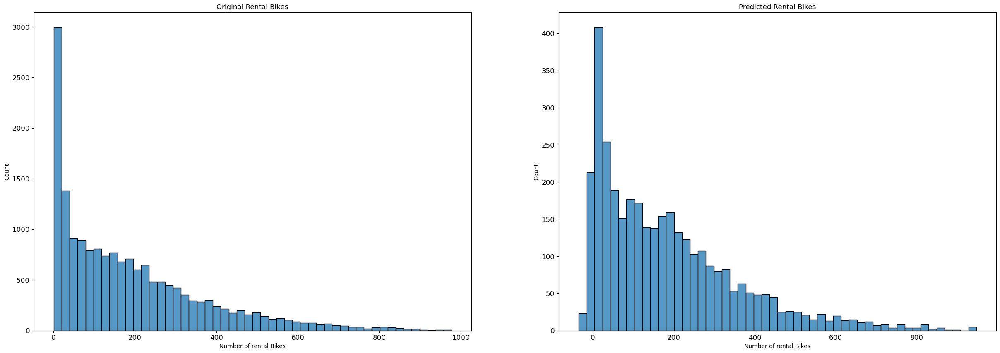

In [19]:
results = pd.DataFrame(list(results.items()), columns=['Number of rental Bikes', 'Count'])
original = pd.DataFrame(list(original.items()), columns=['Number of rental Bikes', 'Count'])

fig, axs = plt.subplots(ncols=2, figsize=(30, 10))

sns.histplot(original, x='Number of rental Bikes', bins=50, weights='Count', ax=axs[0])
axs[0].set(xlabel='Number of rental Bikes', ylabel='Count', title='Original Rental Bikes')

sns.histplot(results, x='Number of rental Bikes', bins=50, weights='Count', ax=axs[1])
axs[1].set(xlabel='Number of rental Bikes', ylabel='Count', title='Predicted Rental Bikes')

plt.show()

In [20]:
model

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num', 'passthrough',
                                                  ['temp', 'atemp', 'hum',
                                                   'windspeed']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['season', 'yr', 'mnth', 'hr',
                                                   'holiday', 'weekday',
                                                   'workingday',
                                                   'weathersit'])])),
                ('model',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=N...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=7, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=400,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=99, ...))])

## PART III: Streamlit dashboard

In [21]:
### This part goes in a separate script ###